<a href="https://colab.research.google.com/github/SanesSnow/lab15/blob/main/lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import matplotlib.pyplot as plt
from matplotlib import cm
import pandas as pd
import torch
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import DataLoader, TensorDataset, random_split

# Загрузка данных.
file_path = "/content/Руденко Александр.csv"
data = pd.read_csv(file_path)

# Предобработка данных.
X = data.iloc[:, 1:-1].values
Y = data.iloc[:, -1].values

# Нормализуем признаки.
x_min = X.min(axis=0)
x_max = X.max(axis=0)
X_normalized = (X - x_min) / (x_max - x_min)

# Нормализация целевой переменной.
y_min = Y.min()
y_max = Y.max()
Y_normalized = (Y - y_min) / (y_max - y_min)

In [17]:
X

array([[ 0.        , 12.11501997,  7.49502603,  1.78993827,  6.40144668,
         0.57766546],
       [ 1.        ,  9.13049198,  6.17599892,  0.53246005, 10.58225997,
         2.12063916],
       [ 1.        ,  4.86280053,  4.59491844,  0.15396687,  4.47082514,
         0.63689792],
       ...,
       [ 1.        ,  9.51977706,  4.88414267,  0.47652779,  1.61667061,
         1.14295152],
       [ 0.        , 14.37496422,  4.54114156,  1.12352583,  8.72181013,
         0.90487853],
       [ 0.        ,  7.67839334,  3.28001094,  1.83680983, 11.44658169,
         1.05797376]])

In [18]:
X_normalized

array([[0.        , 0.55015004, 0.91606154, 0.2811907 , 0.53385961,
        0.41603942],
       [1.        , 0.4297072 , 0.69578771, 0.08354341, 0.8826421 ,
        0.67560967],
       [1.        , 0.25748136, 0.43175172, 0.0240528 , 0.37279836,
        0.42600393],
       ...,
       [1.        , 0.44541709, 0.48005135, 0.07475212, 0.13469179,
        0.51113595],
       [0.        , 0.64135176, 0.42277113, 0.17644565, 0.72743489,
        0.47108558],
       [0.        , 0.37110669, 0.21216586, 0.28855785, 0.95474775,
        0.49684037]])

In [19]:
Y

array([1144.82509751, 1121.5654358 , 1042.4210914 , 1232.90899399,
       1081.52799442, 1058.86459556, 1106.12487885, 1081.5045916 ,
       1083.33813584, 1041.53124066, 1165.09779485, 1055.73274282,
       1033.5107551 , 1037.47636087,  995.96329015, 1134.64678351,
       1112.62884198, 1054.40023644, 1024.54897949, 1066.0706121 ,
       1215.49511584, 1055.4315337 , 1141.52016088, 1112.56676255,
       1088.01624838, 1065.14334083, 1108.31126217, 1197.46854939,
       1006.94928816, 1150.20759705, 1220.90491606, 1430.65551235,
       1304.77776821, 1225.15355988, 1074.56317763, 1327.40755173,
       1086.21048824, 1173.31338286, 1142.96845305, 1126.06100533,
       1039.59969605, 1116.20961418, 1020.24430072, 1103.71402443,
       1172.18712368, 1109.48242012, 1211.33233058, 1129.99457403,
       1136.23857734, 1038.98834439, 1102.21105164, 1111.94210318,
       1037.83844256, 1198.86908657, 1025.97655334, 1148.21395264,
       1066.01132742, 1118.6440944 , 1120.76242331, 1054.34307

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [21]:
# Конвертация в тензоры PyTorch
X_tensor = torch.FloatTensor(X_normalized).to(device)
# Приведение Y к форме столбца.
Y_tensor = torch.FloatTensor(Y_normalized).reshape(-1, 1).to(device)

# X_tensor = torch.FloatTensor(X)
# Y_tensor = torch.FloatTensor(Y).reshape(-1, 1)

In [22]:
# Создание датасета.
dataset = TensorDataset(X_tensor, Y_tensor)

In [23]:
len(dataset)

1000

In [24]:
torch.manual_seed(42)
# Длины подмножеств для обучения и тестирования.
train_size = int(0.7 * len(dataset))  # 70% для обучения.
test_size = len(dataset) - train_size  # Остальные 30% для тестирования.

# Случайное разделение на обучающую и тестовую выборки.
train_dataset, test_dataset = random_split(dataset, (train_size, test_size))

In [25]:
X_train, y_train = train_dataset[:]
X_test, y_test = test_dataset[:]

In [26]:
loss_function = torch.nn.MSELoss(reduction="mean")

In [27]:
# Функция обучения нейронной сети.
def train_nn(name, model, optimizer, writer, epochs=10000):
  # Сохранение начальных весов
  initial_weights = model.state_dict()
  torch.save(initial_weights, f"/content/weights/initial_weights_{name}.pth")
  for epoch in range(epochs):
    model.train()
    predictions = model(X_train)
    loss = loss_function(predictions, y_train)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Перевод модели в режим оценки.
    model.eval()

    #Вычисление потерь на тестовой выборке без вычисления градиентов
    with torch.no_grad():
      test_predictions = model(X_test)
      test_loss = loss_function(test_predictions, y_test)

    if (epoch + 1) % 100 == 0:
      print(f"Epoch {epoch + 1}: Train Loss = {loss.item():.8f}, Test Loss = {test_loss.item():.8f}")
    writer.add_scalars('Loss', {'Train': loss.item(), 'Test': test_loss.item()}, epoch)

  writer.close()

In [28]:
# Однослойная NN, RELU - Adam

model_1 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 1)
        )
model_1.to(device)

name_model = "ReLU_Adam"
writer = SummaryWriter(log_dir="results_lab3/ReLU_Adam")
optimizer = torch.optim.Adam(model_1.parameters(), lr=0.0001)
train_nn(name_model, model_1, optimizer, writer, epochs=10000)

Epoch 100: Train Loss = 0.01878700, Test Loss = 0.02268015
Epoch 200: Train Loss = 0.01470478, Test Loss = 0.01765757
Epoch 300: Train Loss = 0.01110708, Test Loss = 0.01328613
Epoch 400: Train Loss = 0.00834363, Test Loss = 0.00984655
Epoch 500: Train Loss = 0.00623152, Test Loss = 0.00725520
Epoch 600: Train Loss = 0.00459400, Test Loss = 0.00531301
Epoch 700: Train Loss = 0.00347582, Test Loss = 0.00401884
Epoch 800: Train Loss = 0.00276913, Test Loss = 0.00319390
Epoch 900: Train Loss = 0.00235933, Test Loss = 0.00269917
Epoch 1000: Train Loss = 0.00212392, Test Loss = 0.00240057
Epoch 1100: Train Loss = 0.00196850, Test Loss = 0.00219588
Epoch 1200: Train Loss = 0.00185692, Test Loss = 0.00205941
Epoch 1300: Train Loss = 0.00177745, Test Loss = 0.00195422
Epoch 1400: Train Loss = 0.00171716, Test Loss = 0.00187497
Epoch 1500: Train Loss = 0.00166253, Test Loss = 0.00180811
Epoch 1600: Train Loss = 0.00161003, Test Loss = 0.00174742
Epoch 1700: Train Loss = 0.00155619, Test Loss = 

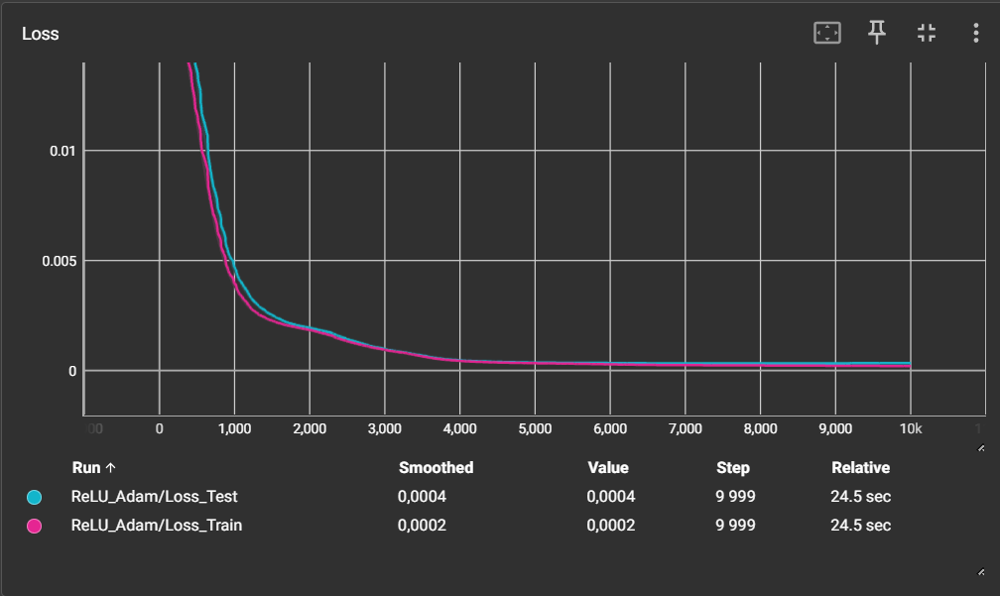

In [29]:
# Однослойная NN, RELU - Adagrad

model_2 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 1)
        )
model_2.to(device)

name_model = "ReLU_Adagrad"
log_dir = "results_lab3/ReLU_Adagrad"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adagrad(model_2.parameters(), lr=0.003)
train_nn(name_model, model_2, optimizer, writer, 10000)

Epoch 100: Train Loss = 0.00943442, Test Loss = 0.01087351
Epoch 200: Train Loss = 0.00498581, Test Loss = 0.00587359
Epoch 300: Train Loss = 0.00331620, Test Loss = 0.00389476
Epoch 400: Train Loss = 0.00262825, Test Loss = 0.00303493
Epoch 500: Train Loss = 0.00231591, Test Loss = 0.00259464
Epoch 600: Train Loss = 0.00214585, Test Loss = 0.00234053
Epoch 700: Train Loss = 0.00203255, Test Loss = 0.00217493
Epoch 800: Train Loss = 0.00193263, Test Loss = 0.00204150
Epoch 900: Train Loss = 0.00182412, Test Loss = 0.00192285
Epoch 1000: Train Loss = 0.00171110, Test Loss = 0.00181326
Epoch 1100: Train Loss = 0.00161045, Test Loss = 0.00171672
Epoch 1200: Train Loss = 0.00151183, Test Loss = 0.00162265
Epoch 1300: Train Loss = 0.00141741, Test Loss = 0.00152607
Epoch 1400: Train Loss = 0.00133413, Test Loss = 0.00143434
Epoch 1500: Train Loss = 0.00125971, Test Loss = 0.00134951
Epoch 1600: Train Loss = 0.00119202, Test Loss = 0.00127248
Epoch 1700: Train Loss = 0.00113010, Test Loss = 

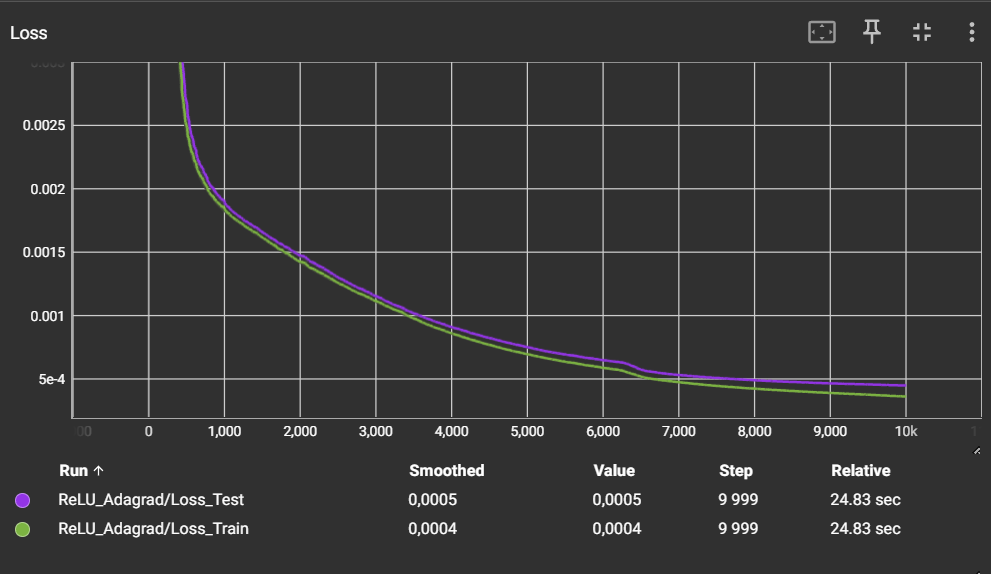

In [30]:
# Однослойная NN, RELU - SGD

model_3 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 1)
        )
model_3.to(device)

name_model = "ReLU_SGD"
log_dir = "results_lab3/ReLU_SGD"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.SGD(model_3.parameters(), lr=0.1)
train_nn(name_model, model_3, optimizer, writer, 20000)

Epoch 100: Train Loss = 0.00357690, Test Loss = 0.00394390
Epoch 200: Train Loss = 0.00219933, Test Loss = 0.00229524
Epoch 300: Train Loss = 0.00202736, Test Loss = 0.00205734
Epoch 400: Train Loss = 0.00196409, Test Loss = 0.00198191
Epoch 500: Train Loss = 0.00191945, Test Loss = 0.00193849
Epoch 600: Train Loss = 0.00188121, Test Loss = 0.00190378
Epoch 700: Train Loss = 0.00184693, Test Loss = 0.00187417
Epoch 800: Train Loss = 0.00181450, Test Loss = 0.00184626
Epoch 900: Train Loss = 0.00178409, Test Loss = 0.00181972
Epoch 1000: Train Loss = 0.00175449, Test Loss = 0.00179388
Epoch 1100: Train Loss = 0.00172593, Test Loss = 0.00176853
Epoch 1200: Train Loss = 0.00169736, Test Loss = 0.00174367
Epoch 1300: Train Loss = 0.00166934, Test Loss = 0.00171912
Epoch 1400: Train Loss = 0.00164214, Test Loss = 0.00169502
Epoch 1500: Train Loss = 0.00161548, Test Loss = 0.00167107
Epoch 1600: Train Loss = 0.00158906, Test Loss = 0.00164840
Epoch 1700: Train Loss = 0.00156215, Test Loss = 

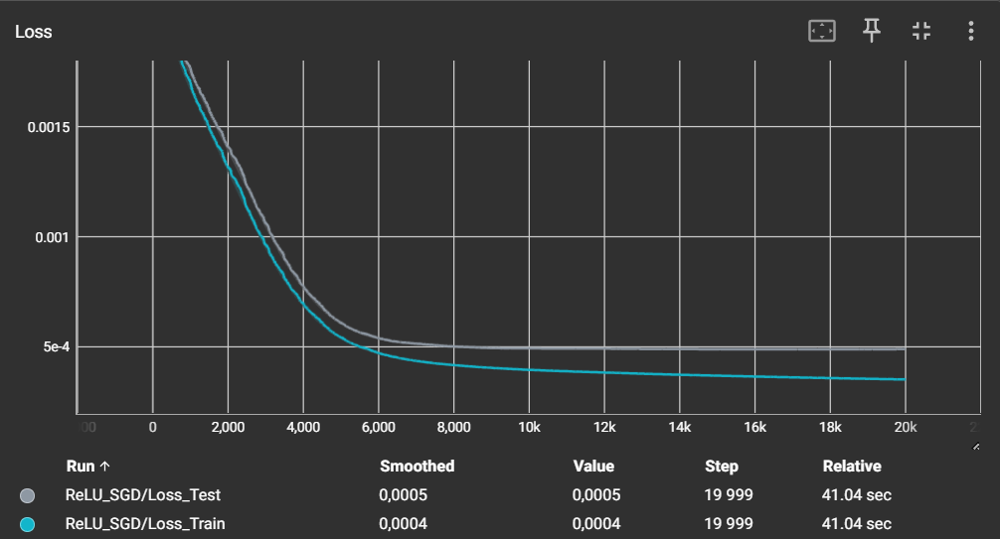

In [31]:
# Однослойная NN, Sigmoid - Adam

model_4 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.Sigmoid(),
        torch.nn.Linear(100, 1)
        )
model_4.to(device)

name_model = "Sigmoid_Adam"
log_dir = "results_lab3/Sigmoid_Adam"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adam(model_4.parameters(), lr=0.1)
train_nn(name_model, model_4, optimizer, writer, 20000)

Epoch 100: Train Loss = 0.02480390, Test Loss = 0.02565223
Epoch 200: Train Loss = 0.01936804, Test Loss = 0.02167008
Epoch 300: Train Loss = 0.01843109, Test Loss = 0.02110140
Epoch 400: Train Loss = 0.01744722, Test Loss = 0.02009180
Epoch 500: Train Loss = 0.01477030, Test Loss = 0.01709764
Epoch 600: Train Loss = 0.00621669, Test Loss = 0.00670260
Epoch 700: Train Loss = 0.00360389, Test Loss = 0.00337068
Epoch 800: Train Loss = 0.00304808, Test Loss = 0.00282112
Epoch 900: Train Loss = 0.00261926, Test Loss = 0.00242582
Epoch 1000: Train Loss = 0.00231145, Test Loss = 0.00215116
Epoch 1100: Train Loss = 0.00206655, Test Loss = 0.00193132
Epoch 1200: Train Loss = 0.00184433, Test Loss = 0.00172629
Epoch 1300: Train Loss = 0.00162592, Test Loss = 0.00151979
Epoch 1400: Train Loss = 0.00140639, Test Loss = 0.00130974
Epoch 1500: Train Loss = 0.00118964, Test Loss = 0.00110242
Epoch 1600: Train Loss = 0.00098480, Test Loss = 0.00090828
Epoch 1700: Train Loss = 0.00080296, Test Loss = 

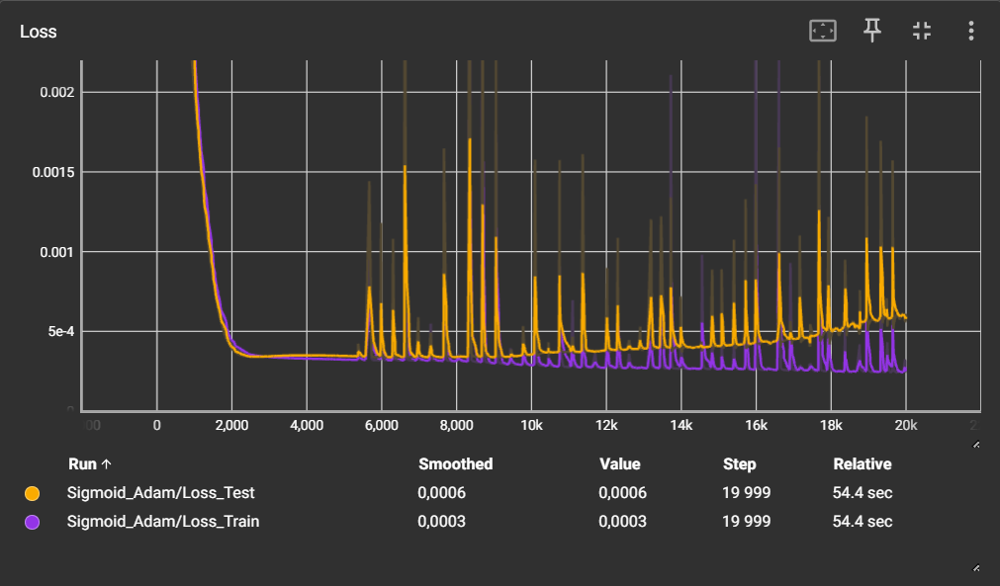

In [32]:
# Однослойная NN, Sigmoid - Adagrad

model_5 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 10),
        torch.nn.Sigmoid(),
        torch.nn.Linear(10, 1)
        )
model_5.to(device)

name_model = "Sigmoid_Adagrad"
log_dir = "results_lab3/Sigmoid_Adagrad"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adagrad(model_5.parameters(), lr=0.1)
train_nn(name_model, model_5, optimizer, writer, 20000)

Epoch 100: Train Loss = 0.00817557, Test Loss = 0.00899423
Epoch 200: Train Loss = 0.00342479, Test Loss = 0.00368851
Epoch 300: Train Loss = 0.00247317, Test Loss = 0.00257268
Epoch 400: Train Loss = 0.00234201, Test Loss = 0.00237256
Epoch 500: Train Loss = 0.00230635, Test Loss = 0.00230529
Epoch 600: Train Loss = 0.00228251, Test Loss = 0.00226715
Epoch 700: Train Loss = 0.00226122, Test Loss = 0.00223891
Epoch 800: Train Loss = 0.00224119, Test Loss = 0.00221489
Epoch 900: Train Loss = 0.00222214, Test Loss = 0.00219299
Epoch 1000: Train Loss = 0.00220389, Test Loss = 0.00217234
Epoch 1100: Train Loss = 0.00218635, Test Loss = 0.00215254
Epoch 1200: Train Loss = 0.00216939, Test Loss = 0.00213338
Epoch 1300: Train Loss = 0.00215292, Test Loss = 0.00211474
Epoch 1400: Train Loss = 0.00213685, Test Loss = 0.00209650
Epoch 1500: Train Loss = 0.00212110, Test Loss = 0.00207856
Epoch 1600: Train Loss = 0.00210558, Test Loss = 0.00206086
Epoch 1700: Train Loss = 0.00209024, Test Loss = 

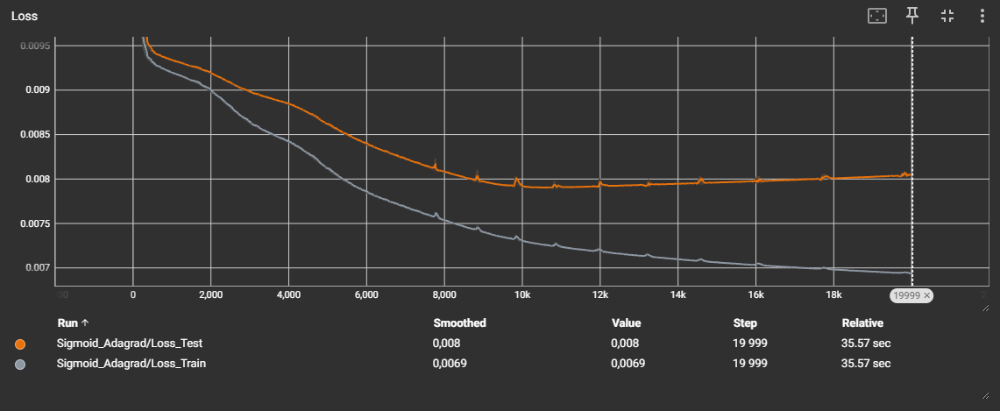

In [33]:
# Однослойная NN, Sigmoid - SGD

model_6 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 6),
        torch.nn.Sigmoid(),
        torch.nn.Linear(6, 1)
        )
model_6.to(device)

name_model = "Sigmoid_SGD"
log_dir = "results_lab3/Sigmoid_SGD"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.SGD(model_6.parameters(), lr=0.001)
train_nn(name_model, model_6, optimizer, writer, 200000)

Epoch 100: Train Loss = 0.05806916, Test Loss = 0.06140383
Epoch 200: Train Loss = 0.03323336, Test Loss = 0.03590848
Epoch 300: Train Loss = 0.02494029, Test Loss = 0.02717288
Epoch 400: Train Loss = 0.02217002, Test Loss = 0.02412641
Epoch 500: Train Loss = 0.02124142, Test Loss = 0.02303137
Epoch 600: Train Loss = 0.02092643, Test Loss = 0.02261791
Epoch 700: Train Loss = 0.02081580, Test Loss = 0.02244956
Epoch 800: Train Loss = 0.02077321, Test Loss = 0.02237328
Epoch 900: Train Loss = 0.02075326, Test Loss = 0.02233368
Epoch 1000: Train Loss = 0.02074085, Test Loss = 0.02230979
Epoch 1100: Train Loss = 0.02073096, Test Loss = 0.02229314
Epoch 1200: Train Loss = 0.02072192, Test Loss = 0.02228007
Epoch 1300: Train Loss = 0.02071316, Test Loss = 0.02226887
Epoch 1400: Train Loss = 0.02070450, Test Loss = 0.02225868
Epoch 1500: Train Loss = 0.02069589, Test Loss = 0.02224906
Epoch 1600: Train Loss = 0.02068730, Test Loss = 0.02223976
Epoch 1700: Train Loss = 0.02067871, Test Loss = 

In [34]:
train_nn(name_model, model_6, optimizer, writer, 200000)

Epoch 100: Train Loss = 0.00359344, Test Loss = 0.00391322
Epoch 200: Train Loss = 0.00359001, Test Loss = 0.00390926
Epoch 300: Train Loss = 0.00358659, Test Loss = 0.00390531
Epoch 400: Train Loss = 0.00358318, Test Loss = 0.00390136
Epoch 500: Train Loss = 0.00357977, Test Loss = 0.00389743
Epoch 600: Train Loss = 0.00357636, Test Loss = 0.00389350
Epoch 700: Train Loss = 0.00357296, Test Loss = 0.00388957
Epoch 800: Train Loss = 0.00356957, Test Loss = 0.00388564
Epoch 900: Train Loss = 0.00356618, Test Loss = 0.00388173
Epoch 1000: Train Loss = 0.00356279, Test Loss = 0.00387783
Epoch 1100: Train Loss = 0.00355942, Test Loss = 0.00387393
Epoch 1200: Train Loss = 0.00355604, Test Loss = 0.00387003
Epoch 1300: Train Loss = 0.00355267, Test Loss = 0.00386615
Epoch 1400: Train Loss = 0.00354930, Test Loss = 0.00386228
Epoch 1500: Train Loss = 0.00354594, Test Loss = 0.00385840
Epoch 1600: Train Loss = 0.00354260, Test Loss = 0.00385455
Epoch 1700: Train Loss = 0.00353926, Test Loss = 

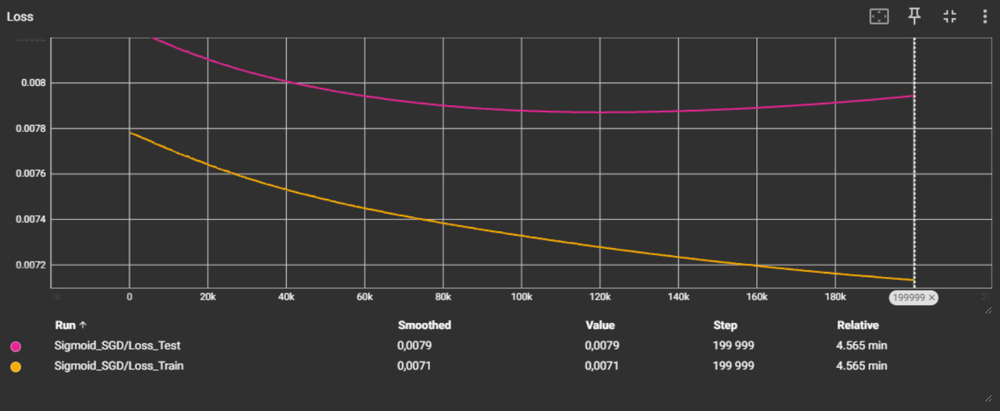

In [35]:
# Двухслойная NN, RELU - Sigmoid - Adam

model_7 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 100),
        torch.nn.Sigmoid(),
        torch.nn.Linear(100, 1)
        )
model_7.to(device)

name_model = "ReLU_Sigmoid_Adam"
log_dir = "results_lab3/ReLU_Sigmoid_Adam"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adam(model_7.parameters(), lr=0.01)
train_nn(name_model, model_7, optimizer, writer, 3000)

Epoch 100: Train Loss = 0.00110855, Test Loss = 0.00106668
Epoch 200: Train Loss = 0.00041537, Test Loss = 0.00044543
Epoch 300: Train Loss = 0.00033752, Test Loss = 0.00039565
Epoch 400: Train Loss = 0.00031591, Test Loss = 0.00039232
Epoch 500: Train Loss = 0.00030253, Test Loss = 0.00039141
Epoch 600: Train Loss = 0.00029327, Test Loss = 0.00039310
Epoch 700: Train Loss = 0.00028563, Test Loss = 0.00039616
Epoch 800: Train Loss = 0.00027956, Test Loss = 0.00039948
Epoch 900: Train Loss = 0.00027384, Test Loss = 0.00040567
Epoch 1000: Train Loss = 0.00026998, Test Loss = 0.00040369
Epoch 1100: Train Loss = 0.00027392, Test Loss = 0.00042864
Epoch 1200: Train Loss = 0.00028731, Test Loss = 0.00041213
Epoch 1300: Train Loss = 0.00026225, Test Loss = 0.00043389
Epoch 1400: Train Loss = 0.00036178, Test Loss = 0.00060868
Epoch 1500: Train Loss = 0.00027100, Test Loss = 0.00040562
Epoch 1600: Train Loss = 0.00045456, Test Loss = 0.00073280
Epoch 1700: Train Loss = 0.00025341, Test Loss = 

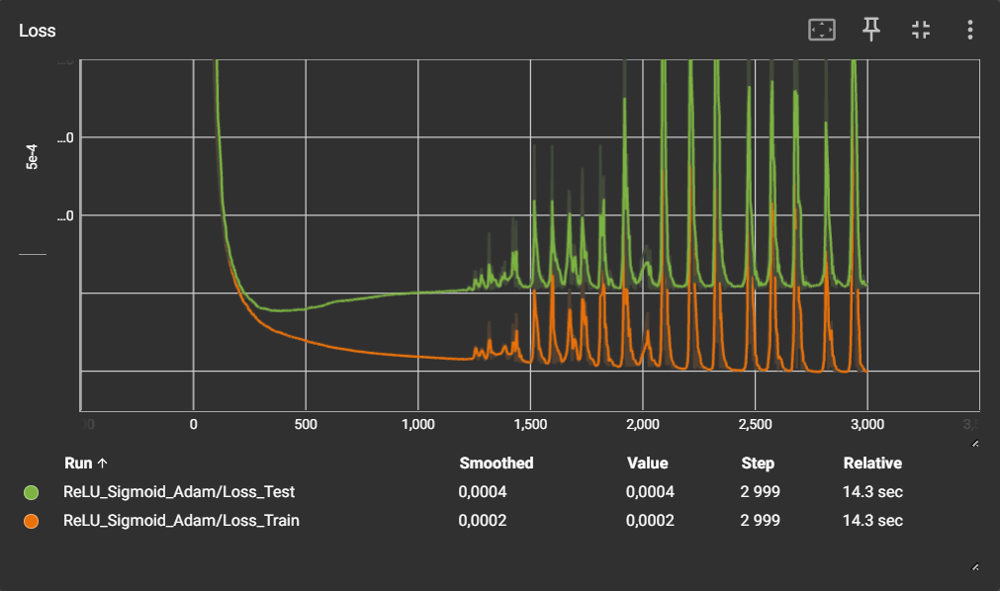

In [36]:
# Двухслойная NN, RELU - Sigmoid - Adagrad

model_8 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 100),
        torch.nn.Sigmoid(),
        torch.nn.Linear(100, 1)
        )
model_8.to(device)

name_model = "ReLU_Sigmoid_Adagrad"
log_dir = "results_lab3/ReLU_Sigmoid_Adagrad"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adagrad(model_8.parameters(), lr=0.01)
train_nn(name_model, model_8, optimizer, writer, 5000)

Epoch 100: Train Loss = 0.00133265, Test Loss = 0.00140166
Epoch 200: Train Loss = 0.00108915, Test Loss = 0.00099175
Epoch 300: Train Loss = 0.00072126, Test Loss = 0.00066076
Epoch 400: Train Loss = 0.00054011, Test Loss = 0.00052817
Epoch 500: Train Loss = 0.00048346, Test Loss = 0.00048335
Epoch 600: Train Loss = 0.00044951, Test Loss = 0.00045881
Epoch 700: Train Loss = 0.00041315, Test Loss = 0.00044546
Epoch 800: Train Loss = 0.00038768, Test Loss = 0.00043920
Epoch 900: Train Loss = 0.00038777, Test Loss = 0.00043121
Epoch 1000: Train Loss = 0.00036931, Test Loss = 0.00042381
Epoch 1100: Train Loss = 0.00035777, Test Loss = 0.00041913
Epoch 1200: Train Loss = 0.00035132, Test Loss = 0.00041486
Epoch 1300: Train Loss = 0.00034779, Test Loss = 0.00041016
Epoch 1400: Train Loss = 0.00034172, Test Loss = 0.00040782
Epoch 1500: Train Loss = 0.00033469, Test Loss = 0.00040605
Epoch 1600: Train Loss = 0.00033004, Test Loss = 0.00040347
Epoch 1700: Train Loss = 0.00032667, Test Loss = 

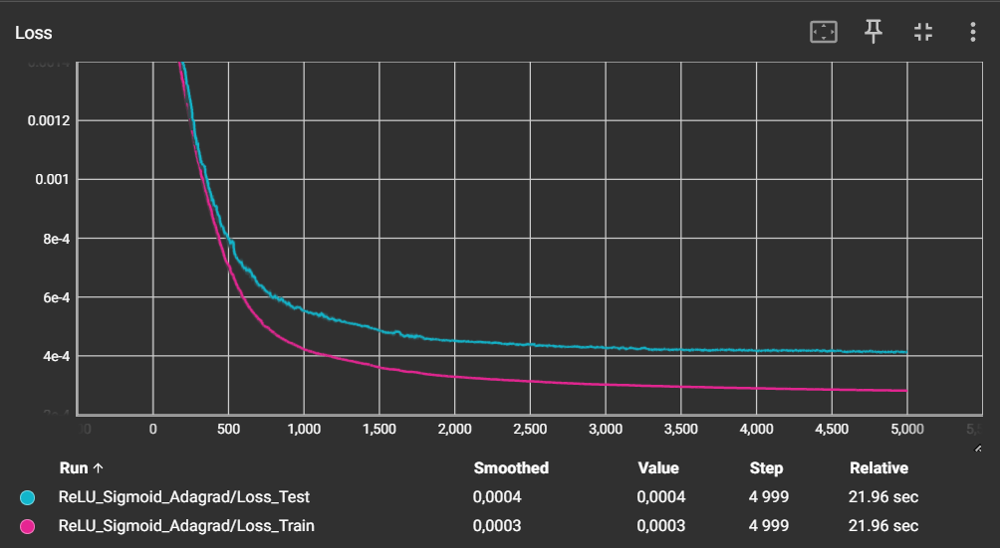

In [37]:
# Двухслойная NN, RELU - Sigmoid - SGD

model_9 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 6),
        torch.nn.ReLU(),
        torch.nn.Linear(6, 6),
        torch.nn.Sigmoid(),
        torch.nn.Linear(6, 1)
        )
model_9.to(device)

name_model = "ReLU_Sigmoid_SGD"
log_dir = "results_lab3/ReLU_Sigmoid_SGD"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.SGD(model_9.parameters(), lr=0.1)
train_nn(name_model, model_9, optimizer, writer, 30000)

Epoch 100: Train Loss = 0.02017257, Test Loss = 0.02185627
Epoch 200: Train Loss = 0.02000041, Test Loss = 0.02166635
Epoch 300: Train Loss = 0.01979682, Test Loss = 0.02144066
Epoch 400: Train Loss = 0.01954358, Test Loss = 0.02116377
Epoch 500: Train Loss = 0.01922321, Test Loss = 0.02082161
Epoch 600: Train Loss = 0.01881114, Test Loss = 0.02038928
Epoch 700: Train Loss = 0.01827942, Test Loss = 0.01984944
Epoch 800: Train Loss = 0.01759394, Test Loss = 0.01917679
Epoch 900: Train Loss = 0.01676718, Test Loss = 0.01834839
Epoch 1000: Train Loss = 0.01577776, Test Loss = 0.01733191
Epoch 1100: Train Loss = 0.01461785, Test Loss = 0.01612067
Epoch 1200: Train Loss = 0.01326723, Test Loss = 0.01469884
Epoch 1300: Train Loss = 0.01175616, Test Loss = 0.01308659
Epoch 1400: Train Loss = 0.01013736, Test Loss = 0.01132752
Epoch 1500: Train Loss = 0.00848814, Test Loss = 0.00950788
Epoch 1600: Train Loss = 0.00692754, Test Loss = 0.00776772
Epoch 1700: Train Loss = 0.00556490, Test Loss = 

In [38]:
train_nn(name_model, model_9, optimizer, writer, 70000)

Epoch 100: Train Loss = 0.00054589, Test Loss = 0.00051455
Epoch 200: Train Loss = 0.00054571, Test Loss = 0.00051433
Epoch 300: Train Loss = 0.00054553, Test Loss = 0.00051414
Epoch 400: Train Loss = 0.00054535, Test Loss = 0.00051394
Epoch 500: Train Loss = 0.00054519, Test Loss = 0.00051378
Epoch 600: Train Loss = 0.00054505, Test Loss = 0.00051364
Epoch 700: Train Loss = 0.00054491, Test Loss = 0.00051350
Epoch 800: Train Loss = 0.00054478, Test Loss = 0.00051334
Epoch 900: Train Loss = 0.00054465, Test Loss = 0.00051319
Epoch 1000: Train Loss = 0.00054453, Test Loss = 0.00051306
Epoch 1100: Train Loss = 0.00054441, Test Loss = 0.00051291
Epoch 1200: Train Loss = 0.00054429, Test Loss = 0.00051275
Epoch 1300: Train Loss = 0.00054417, Test Loss = 0.00051262
Epoch 1400: Train Loss = 0.00054405, Test Loss = 0.00051248
Epoch 1500: Train Loss = 0.00054394, Test Loss = 0.00051236
Epoch 1600: Train Loss = 0.00054382, Test Loss = 0.00051224
Epoch 1700: Train Loss = 0.00054371, Test Loss = 

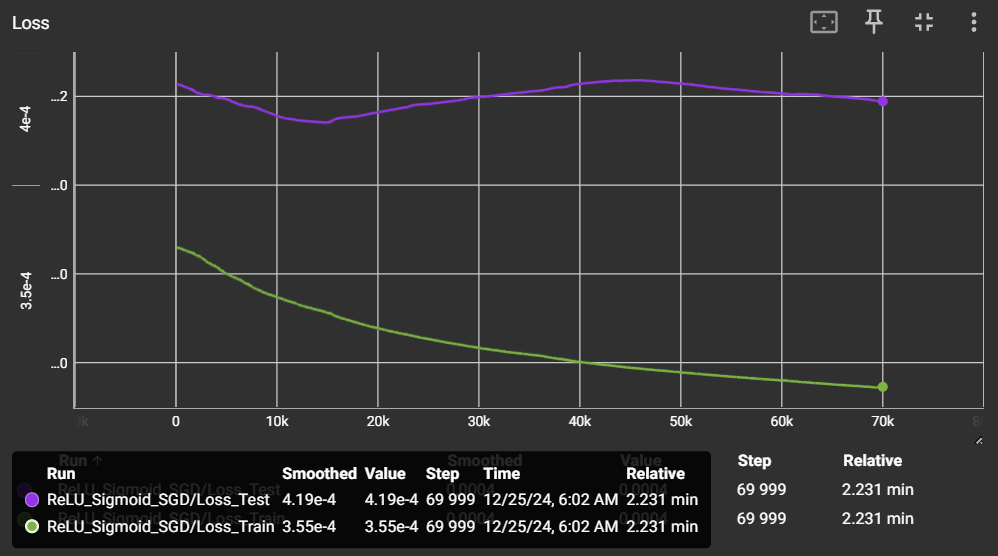

In [39]:
# Двухслойная NN, Sigmoid - RELU - Adam

model_10 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.Sigmoid(),
        torch.nn.Linear(100, 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 1)
        )
model_10.to(device)

name_model = "Sigmoid_ReLU_Adam"
log_dir = "results_lab3/Sigmoid_ReLU_Adam"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adam(model_10.parameters(), lr=0.01)
train_nn(name_model, model_10, optimizer, writer, 20000)

Epoch 100: Train Loss = 0.01881795, Test Loss = 0.02052877
Epoch 200: Train Loss = 0.00115891, Test Loss = 0.00132555
Epoch 300: Train Loss = 0.00098637, Test Loss = 0.00107204
Epoch 400: Train Loss = 0.00141865, Test Loss = 0.00101923
Epoch 500: Train Loss = 0.00091516, Test Loss = 0.00097549
Epoch 600: Train Loss = 0.00089078, Test Loss = 0.00094721
Epoch 700: Train Loss = 0.00086647, Test Loss = 0.00092010
Epoch 800: Train Loss = 0.00084353, Test Loss = 0.00089534
Epoch 900: Train Loss = 0.00082062, Test Loss = 0.00087159
Epoch 1000: Train Loss = 0.00080011, Test Loss = 0.00085190
Epoch 1100: Train Loss = 0.00077852, Test Loss = 0.00083925
Epoch 1200: Train Loss = 0.00076090, Test Loss = 0.00083364
Epoch 1300: Train Loss = 0.00074675, Test Loss = 0.00082619
Epoch 1400: Train Loss = 0.00073454, Test Loss = 0.00081922
Epoch 1500: Train Loss = 0.00072342, Test Loss = 0.00081257
Epoch 1600: Train Loss = 0.00071501, Test Loss = 0.00079737
Epoch 1700: Train Loss = 0.00073213, Test Loss = 

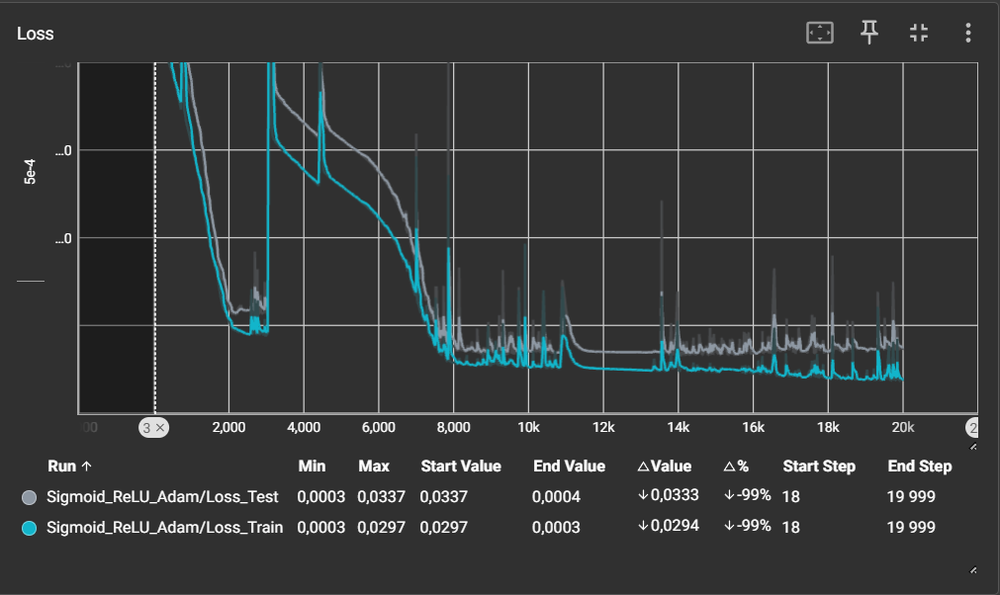

In [40]:
# Двухслойная NN, Sigmoid - RELU - Adagrad

model_11 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 10),
        torch.nn.Sigmoid(),
        torch.nn.Linear(10, 10),
        torch.nn.ReLU(),
        torch.nn.Linear(10, 1)
        )
model_11.to(device)

name_model = "Sigmoid_ReLU_Adagrad"
log_dir = "results_lab3/Sigmoid_ReLU_Adagrad"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.Adagrad(model_11.parameters(), lr=0.1)
train_nn(name_model, model_11, optimizer, writer, 30000)

Epoch 100: Train Loss = 0.01826442, Test Loss = 0.02008082
Epoch 200: Train Loss = 0.01287731, Test Loss = 0.01415210
Epoch 300: Train Loss = 0.00559012, Test Loss = 0.00619380
Epoch 400: Train Loss = 0.00221078, Test Loss = 0.00255316
Epoch 500: Train Loss = 0.00133418, Test Loss = 0.00153241
Epoch 600: Train Loss = 0.00095393, Test Loss = 0.00108915
Epoch 700: Train Loss = 0.00078295, Test Loss = 0.00086870
Epoch 800: Train Loss = 0.00070550, Test Loss = 0.00075111
Epoch 900: Train Loss = 0.00064795, Test Loss = 0.00067681
Epoch 1000: Train Loss = 0.00060752, Test Loss = 0.00063403
Epoch 1100: Train Loss = 0.00058093, Test Loss = 0.00060780
Epoch 1200: Train Loss = 0.00056268, Test Loss = 0.00059026
Epoch 1300: Train Loss = 0.00054593, Test Loss = 0.00057442
Epoch 1400: Train Loss = 0.00053406, Test Loss = 0.00055952
Epoch 1500: Train Loss = 0.00052485, Test Loss = 0.00054656
Epoch 1600: Train Loss = 0.00051744, Test Loss = 0.00053487
Epoch 1700: Train Loss = 0.00051117, Test Loss = 

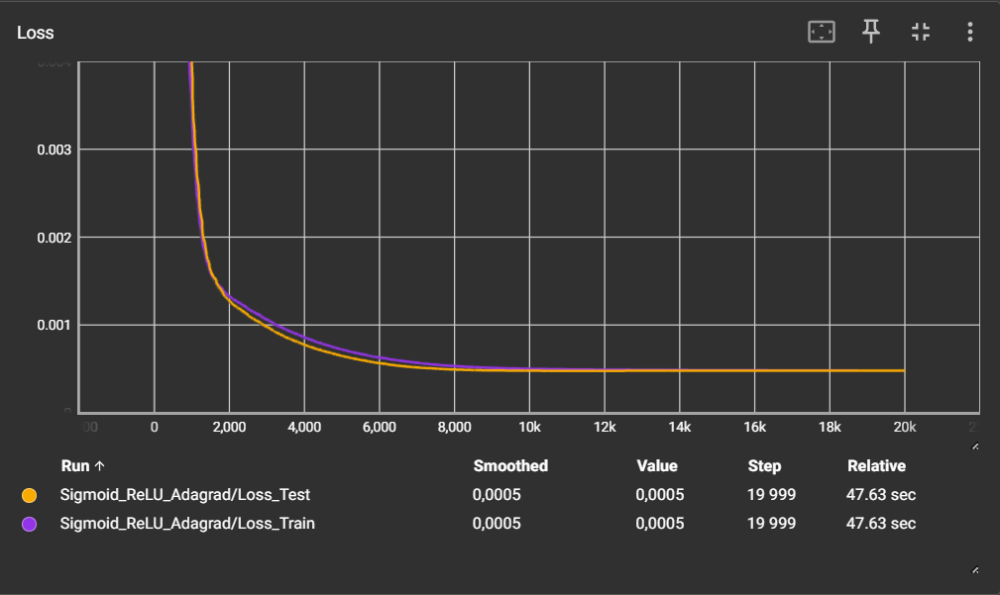

In [41]:
# Двухслойная NN, Sigmoid - ReLU - SGD

model_12 = torch.nn.Sequential(
        torch.nn.Linear(X_train.shape[1], 100),
        torch.nn.Sigmoid(),
        torch.nn.Linear(100, 100),
        torch.nn.ReLU(),
        torch.nn.Linear(100, 1)
        )
model_12.to(device)

name_model = "Sigmoid_ReLU_SGD"
log_dir = "results_lab3/Sigmoid_ReLU_SGD"
writer = SummaryWriter(log_dir=log_dir)
optimizer = torch.optim.SGD(model_12.parameters(), lr=0.01, momentum=0.9)
train_nn(name_model, model_12, optimizer, writer, 35000)

Epoch 100: Train Loss = 0.01832649, Test Loss = 0.01986752
Epoch 200: Train Loss = 0.01585815, Test Loss = 0.01722509
Epoch 300: Train Loss = 0.01301584, Test Loss = 0.01417125
Epoch 400: Train Loss = 0.00988963, Test Loss = 0.01081164
Epoch 500: Train Loss = 0.00691343, Test Loss = 0.00759852
Epoch 600: Train Loss = 0.00460076, Test Loss = 0.00507116
Epoch 700: Train Loss = 0.00316634, Test Loss = 0.00347620
Epoch 800: Train Loss = 0.00242357, Test Loss = 0.00260957
Epoch 900: Train Loss = 0.00205712, Test Loss = 0.00215370
Epoch 1000: Train Loss = 0.00187031, Test Loss = 0.00189529
Epoch 1100: Train Loss = 0.00176208, Test Loss = 0.00174074
Epoch 1200: Train Loss = 0.00169599, Test Loss = 0.00164434
Epoch 1300: Train Loss = 0.00165113, Test Loss = 0.00157958
Epoch 1400: Train Loss = 0.00161638, Test Loss = 0.00153033
Epoch 1500: Train Loss = 0.00158624, Test Loss = 0.00149220
Epoch 1600: Train Loss = 0.00155943, Test Loss = 0.00145874
Epoch 1700: Train Loss = 0.00153437, Test Loss = 

In [42]:
train_nn(name_model, model_12, optimizer, writer, 30000)

Epoch 100: Train Loss = 0.00033333, Test Loss = 0.00037433
Epoch 200: Train Loss = 0.00033316, Test Loss = 0.00037422
Epoch 300: Train Loss = 0.00033299, Test Loss = 0.00037416
Epoch 400: Train Loss = 0.00033284, Test Loss = 0.00037418
Epoch 500: Train Loss = 0.00033268, Test Loss = 0.00037397
Epoch 600: Train Loss = 0.00033253, Test Loss = 0.00037396
Epoch 700: Train Loss = 0.00033237, Test Loss = 0.00037390
Epoch 800: Train Loss = 0.00033222, Test Loss = 0.00037393
Epoch 900: Train Loss = 0.00033207, Test Loss = 0.00037390
Epoch 1000: Train Loss = 0.00033193, Test Loss = 0.00037380
Epoch 1100: Train Loss = 0.00033178, Test Loss = 0.00037380
Epoch 1200: Train Loss = 0.00033164, Test Loss = 0.00037379
Epoch 1300: Train Loss = 0.00033150, Test Loss = 0.00037382
Epoch 1400: Train Loss = 0.00033135, Test Loss = 0.00037385
Epoch 1500: Train Loss = 0.00033121, Test Loss = 0.00037386
Epoch 1600: Train Loss = 0.00033106, Test Loss = 0.00037394
Epoch 1700: Train Loss = 0.00033090, Test Loss = 

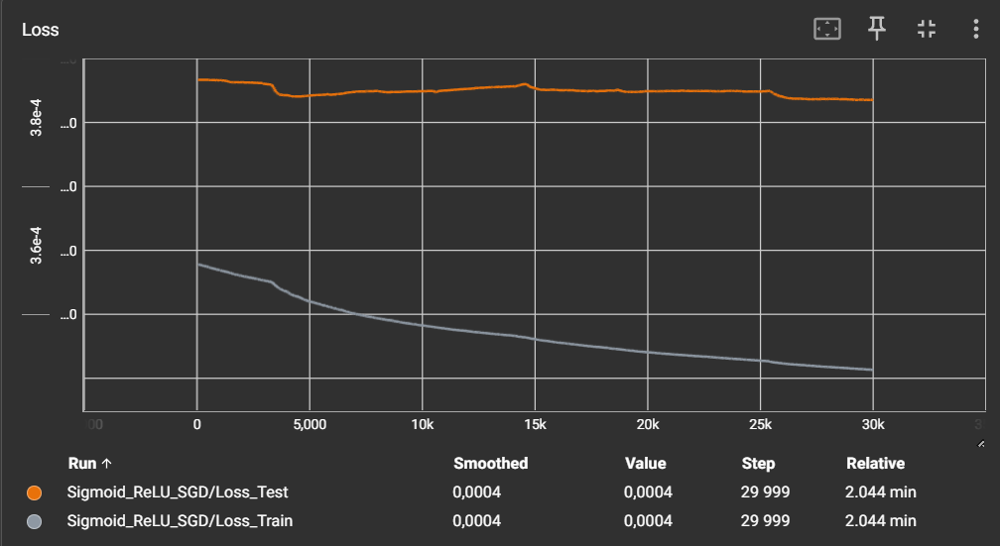

In [43]:
%load_ext tensorboard
%tensorboard --logdir=results_lab3

<IPython.core.display.Javascript object>

In [44]:
%reload_ext tensorboard

In [46]:
from google.colab import files
files.download('/content/results_lab3')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>